In [2]:
%load_ext tensorboard
import pandas as pd
import matplotlib.pyplot as plt
from pandarallel import pandarallel
import seaborn as  sns
import numpy as np

pandarallel.initialize(progress_bar=True)

data = pd.read_csv('fake reviews dataset.csv')
data.head()


INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


,category,rating,label,text_
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor..."
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I..."
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i..."
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...


In [19]:
data.describe()

,rating
count,40432.000000
mean,4.256579
std,1.144354
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


## Tokenized the text

`pandarallel` is a python library for parallelizing your pandas operations. It provides function such as `parallel_apply` to run `apply` in parallel.

In [20]:
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
data['tokenized_text'] = data['text_'].parallel_apply(word_tokenize)

In [21]:
data['text_length'] = data['tokenized_text'].apply(lambda x: len(x))
data.head()

,category,rating,label,text_,tokenized_text,text_length
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20


## Analysis of data

We can see that the most review length are around 24 to 96 length.

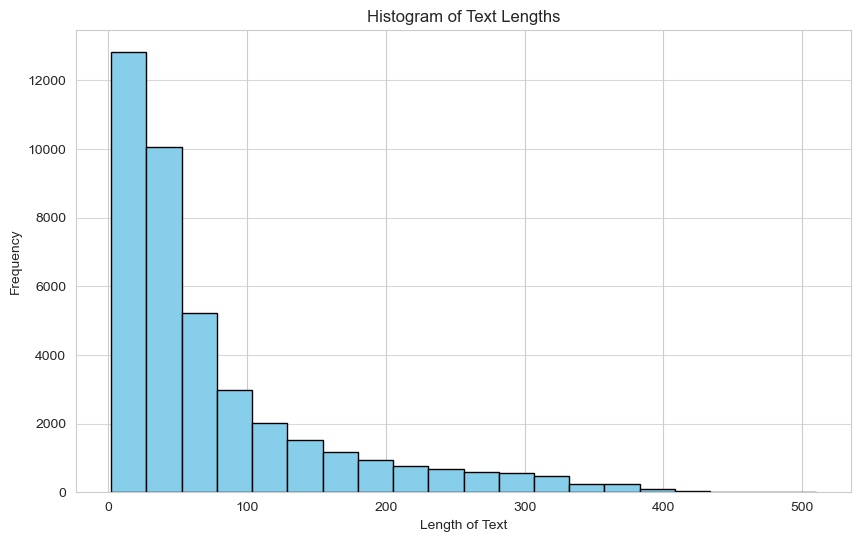

In [22]:
# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(data['text_length'].to_list(), bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Text Lengths')
plt.xlabel('Length of Text')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)

# Display the histogram
plt.show()

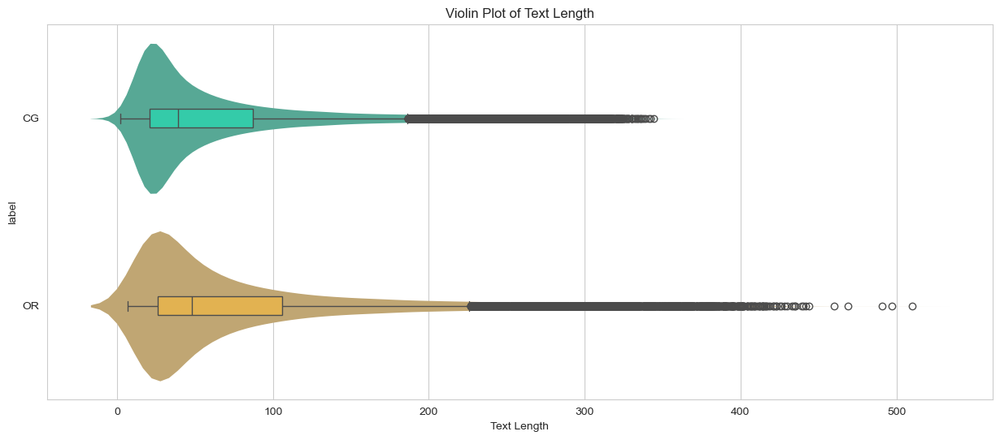

In [23]:
plt.figure(figsize=(15, 6))
ax = sns.violinplot(data, x='text_length', y='label', palette='turbo', inner=None, linewidth=0, saturation=0.4, hue="label")
plt.title('Violin Plot of Text Length')
plt.xlabel('Text Length')
sns.boxplot(data, x='text_length', y='label', palette='turbo', width=0.1,
            boxprops={'zorder': 2}, ax=ax, hue="label")
plt.show()

In [24]:
q1 = np.percentile(data['text_length'], 25)
q3 = np.percentile(data['text_length'], 75)
print("50% of the review length is between {:0.0f}-{:0.0f}".format(q1, q3))

50% of the review length is between 24-96


## Most common words used
Before preprocessing

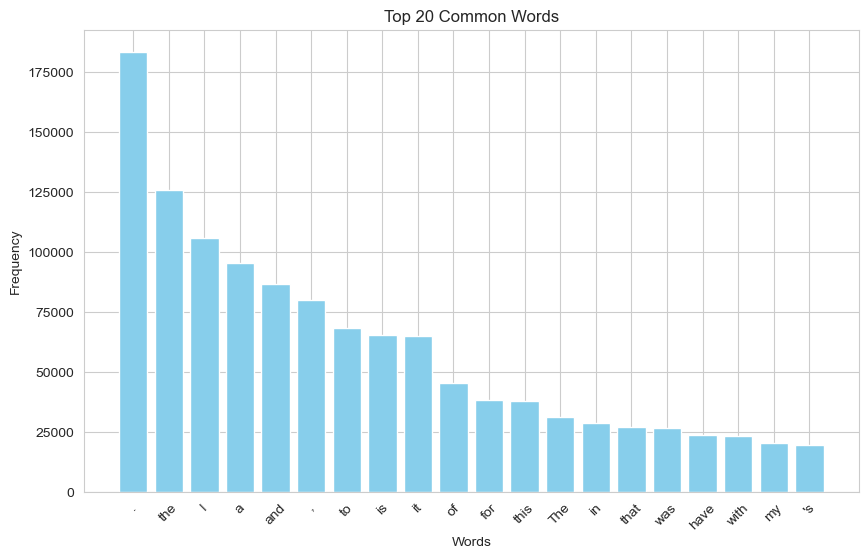

In [25]:
import pandas as pd
import nltk
from nltk.probability import FreqDist
from itertools import chain

def flatten_words(data):
    return list(chain.from_iterable(data))

def find_common_words_with_freqdist(data):
    # Flatten all words from all columns into a single list
    all_words = flatten_words(data)
    
    # Create a frequency distribution
    freq_dist = FreqDist(all_words)
    return freq_dist

# Find and print the common words
common_words = find_common_words_with_freqdist(data['tokenized_text'])

# Separating the words and their frequencies for plotting
words, frequencies = zip(*common_words.most_common(20))

# Creating the bar graph
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies, color='skyblue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Common Words')
plt.xticks(rotation=45)  # Rotate the word labels for better readability
plt.show()

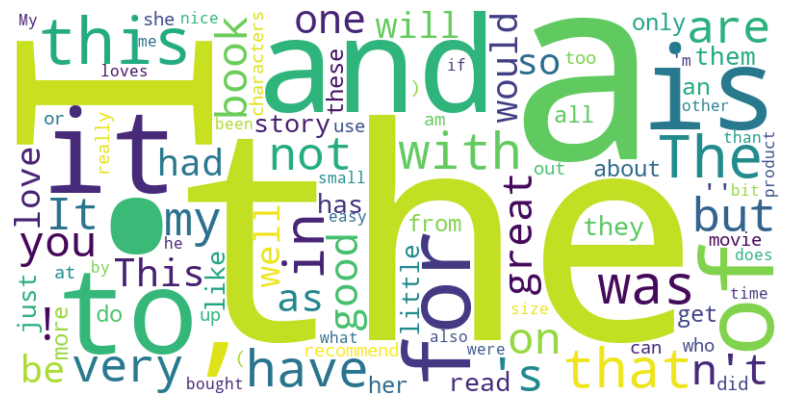

In [26]:
from wordcloud import WordCloud

def display_wordcloud(frequency_distribution):
    wordcloud = WordCloud(width = 800, height = 400, background_color ='white').generate_from_frequencies(frequency_distribution)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


display_wordcloud(dict(common_words.most_common(100)))

# Number of real and fake reviews in each category

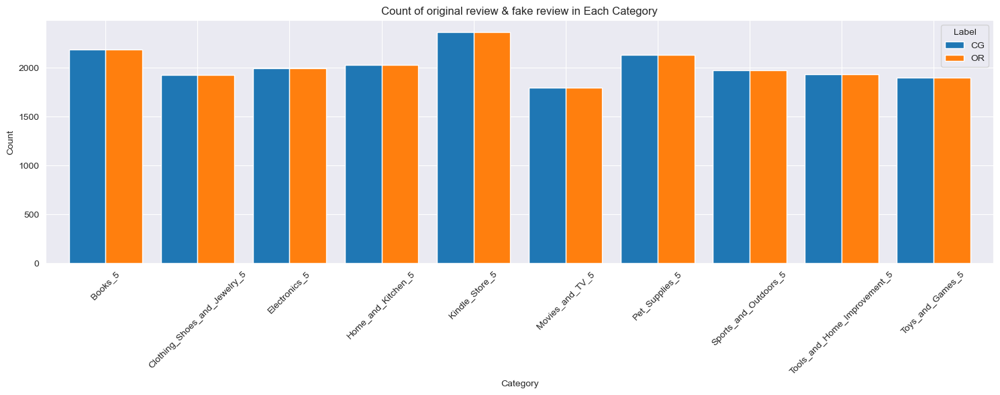

In [4]:
filtered_data = data[data['label'].isin(['CG', 'OR'])]

label_counts = filtered_data.groupby(['category', 'label']).size().unstack(fill_value=0)

label_counts.plot(kind='bar', figsize=(15, 6), width=0.8)
plt.title('Count of original review & fake review in Each Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Label')
plt.tight_layout()
plt.show()

# Distribution of Ratings Between OR and CG Reviews

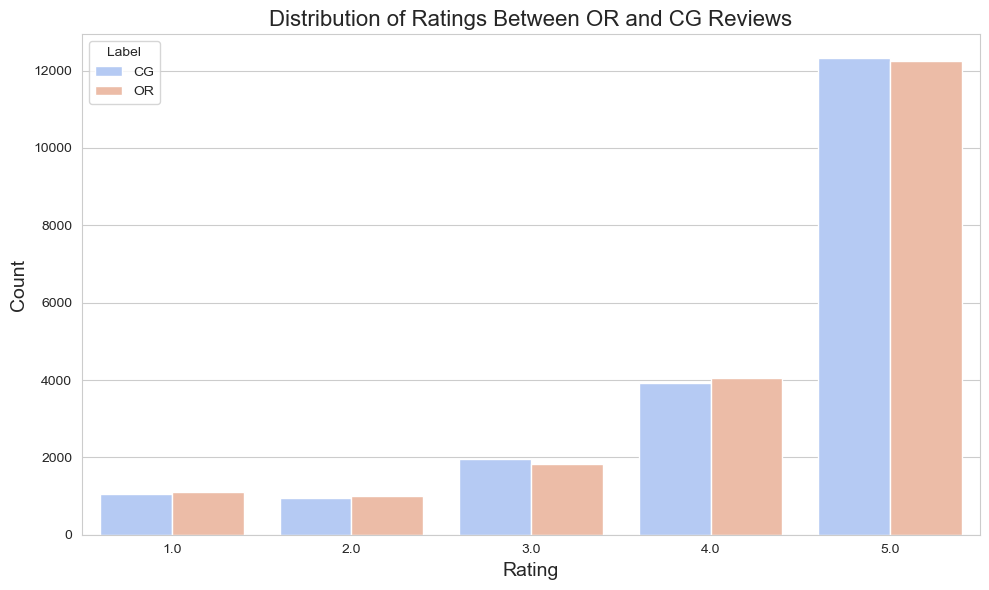

In [27]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the distribution of ratings for both OR and CG reviews
sns.countplot(x='rating', hue='label', data=data, palette='coolwarm', ax=ax)

# Setting the plot title and labels
ax.set_title('Distribution of Ratings Between OR and CG Reviews', fontsize=16)
ax.set_xlabel('Rating', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
ax.legend(title='Label')

# Display the plot
plt.tight_layout()
plt.show()


# Word Cloud (OR vs CG)

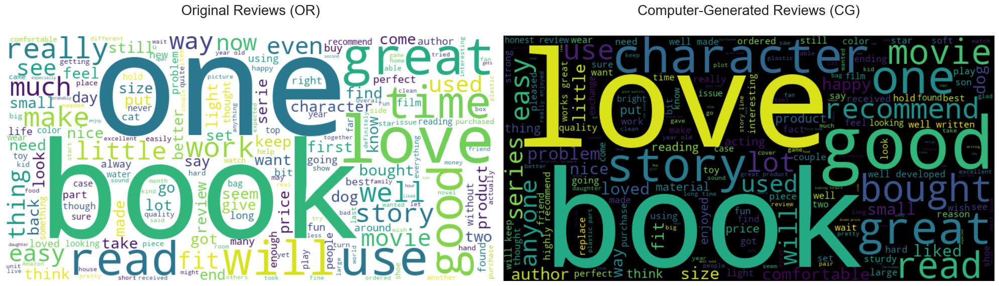

In [28]:
# Separate the reviews based on their label
or_reviews = ' '.join(data[data['label'] == 'OR']['text_'])
cg_reviews = ' '.join(data[data['label'] == 'CG']['text_'])

# Generate word clouds
or_wordcloud = WordCloud(background_color='white', width=800, height=400, max_words=200).generate(or_reviews)
cg_wordcloud = WordCloud(background_color='black', width=800, height=400, max_words=200).generate(cg_reviews)

# Plot the word clouds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].imshow(or_wordcloud, interpolation='bilinear')
axes[0].axis('off')
axes[0].set_title('Original Reviews (OR)', fontsize=20, pad=30)

axes[1].imshow(cg_wordcloud, interpolation='bilinear')
axes[1].axis('off')
axes[1].set_title('Computer-Generated Reviews (CG)', fontsize=20, pad=30)

plt.tight_layout()
plt.show()

# Word Frequency Analysis

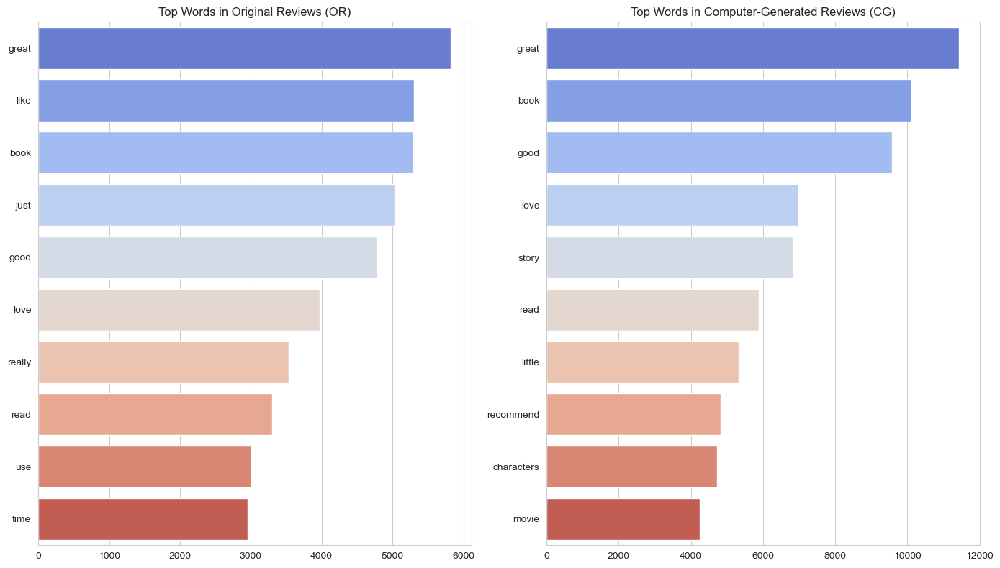

In [29]:
from sklearn.feature_extraction.text import CountVectorizer
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

def plot_top_n_words(text, n=10, title="Top Words", ax=None):
    """
    Plot the top n words in the given text.
    """
    # Define a CountVectorizer, excluding common English stopwords
    vect = CountVectorizer(stop_words='english', ngram_range=(1, 1)).fit(text)
    word_counts = vect.transform(text)
    sum_words = word_counts.sum(axis=0)
    
    words_freq = [(word, sum_words[0, idx]) for word, idx in vect.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    
    # Top n words
    top_words = words_freq[:n]
    words = [word[0] for word in top_words]
    counts = [word[1] for word in top_words]
    
    sns.barplot(x=counts, y=words, palette="coolwarm", ax=ax)
    ax.set_title(title)

# Separate the OR and CG reviews
or_reviews_text = data[data['label'] == 'OR']['text_']
cg_reviews_text = data[data['label'] == 'CG']['text_']

# Create figure for the plots
fig, axes = plt.subplots(1, 2, figsize=(14, 8))

# Plot top words for OR and CG reviews
plot_top_n_words(or_reviews_text, title="Top Words in Original Reviews (OR)", ax=axes[0])
plot_top_n_words(cg_reviews_text, title="Top Words in Computer-Generated Reviews (CG)", ax=axes[1])

plt.tight_layout()
plt.show()

# Rating Distribution by OR and CG

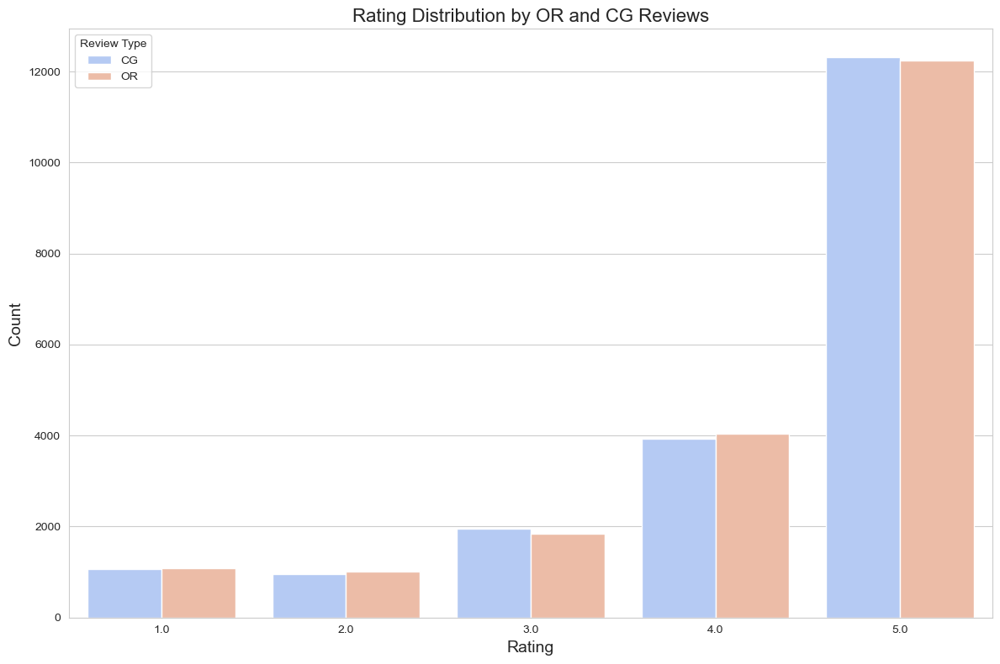

In [30]:
plt.figure(figsize=(12, 8))

# Creating a side-by-side bar chart for the distribution of ratings within OR and CG reviews
sns.countplot(x='rating', hue='label', data=data, palette='coolwarm')

# Setting the plot title and labels
plt.title('Rating Distribution by OR and CG Reviews', fontsize=16)
plt.xlabel('Rating', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Review Type', loc='upper left')

plt.tight_layout()
plt.show()


## Preprocessing

### Remove Stopwords, Remove punctuation, Convert text to lowercase, Stemming

What is Stemming?
Adapted from https://botpenguin.com/glossary/stemming

![stemming](Stemming.png "Stemming")

In [31]:

# nlp preprocessing, stop word remover,
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import string

# nltk.download('punkt')
nltk.download('stopwords')
english_stopwords = set(stopwords.words('english'))
porter = PorterStemmer()

def preprocess_tokenized_text(tokenized_list):
    # Remove punctuation and convert to lowercase
    stripped_tokens = [word.lower().translate(str.maketrans('', '', string.punctuation)) for word in tokenized_list]
    # Apply stemming to each token
    stemmed_tokens = [porter.stem(word) for word in stripped_tokens]
    # Remove stopwords and any empty strings left from stripping punctuation
    return [word for word in stemmed_tokens if word and word not in english_stopwords]

data['tokenized_text_without_stopwords'] = data['tokenized_text'].parallel_apply(preprocess_tokenized_text)
data['text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(' '.join)

data.head()

[nltk_data] Downloading package stopwords to /Users/hx/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,category,rating,label,text_,tokenized_text,text_length,tokenized_text_without_stopwords,text_without_stopwords
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18,"[love, thi, well, made, sturdi, veri, comfort,...",love thi well made sturdi veri comfort love ve...
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19,"[love, great, upgrad, origin, mine, coupl, year]",love great upgrad origin mine coupl year
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16,"[thi, pillow, save, back, love, look, feel, th...",thi pillow save back love look feel thi pillow
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19,"[miss, inform, use, great, product, price]",miss inform use great product price
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20,"[veri, nice, set, good, qualiti, set, two, month]",veri nice set good qualiti set two month


## Most commonly used words after preprocessing

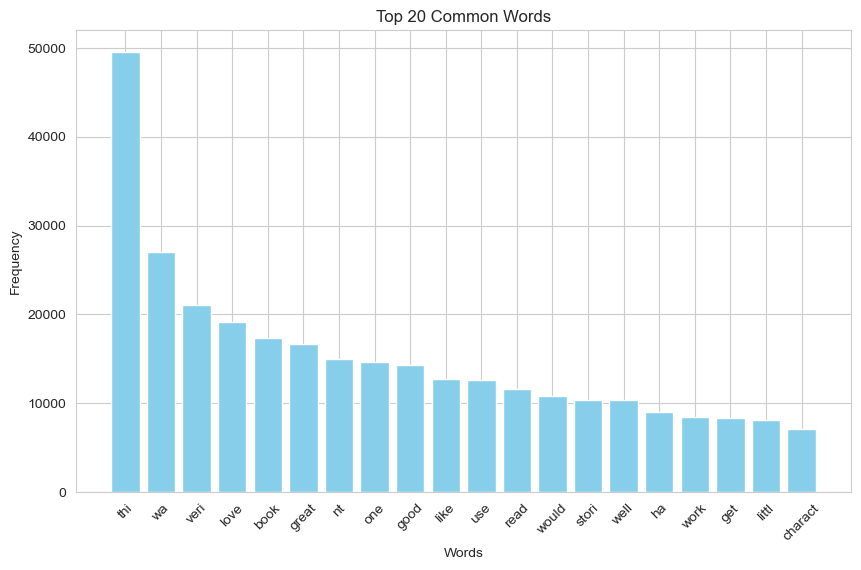

In [32]:
# Find and print the common words
common_words = find_common_words_with_freqdist(data['tokenized_text_without_stopwords'])

# Separating the words and their frequencies for plotting
words, frequencies = zip(*common_words.most_common(20))

# Creating the bar graph
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies, color='skyblue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Common Words')
plt.xticks(rotation=45)  # Rotate the word labels for better readability
plt.show()

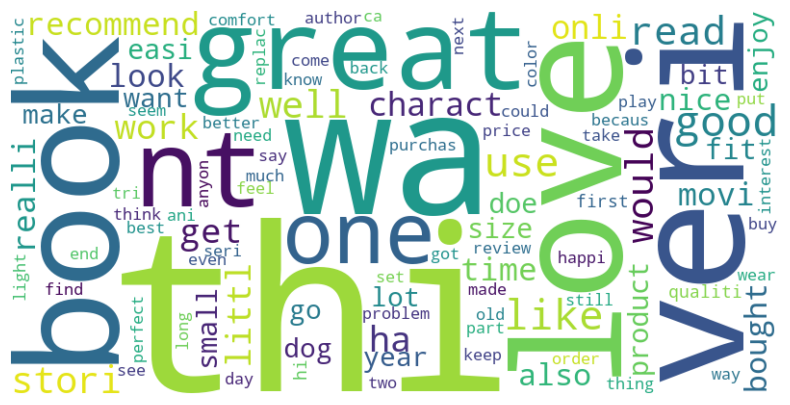

In [33]:
display_wordcloud(dict(common_words.most_common(100)))

# DNN Model

# Using Word2Vec to transform text into vectors

Text will be transform into a fixed-size vector with a dimension of 100

In [39]:
import gensim

vector_dim = 100

model_w2v = gensim.models.Word2Vec(sentences=data['tokenized_text_without_stopwords'], vector_size=vector_dim, window=5, workers=4, min_count=1)

def vectorize_text(text, model_w2v):
    word_vectors = [model_w2v.wv[word] for word in text if word in model_w2v.wv]
    if len(word_vectors) == 0:
        return np.zeros(model_w2v.vector_size)
    else:
        return np.mean(word_vectors, axis=0)
        
data['vectorized_text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(lambda x: vectorize_text(x, model_w2v))
data[['tokenized_text_without_stopwords','vectorized_text_without_stopwords']].head()

,tokenized_text_without_stopwords,vectorized_text_without_stopwords
0,"[love, thi, well, made, sturdi, veri, comfort,...","[0.36146158, -0.61847264, -1.11839, 0.7182733,..."
1,"[love, great, upgrad, origin, mine, coupl, year]","[-0.44234803, -0.065291576, -0.86585194, 0.406..."
2,"[thi, pillow, save, back, love, look, feel, th...","[0.23025388, -0.28033006, -0.868494, 0.3366425..."
3,"[miss, inform, use, great, product, price]","[0.10673118, -0.13800883, -0.36738887, -0.1039..."
4,"[veri, nice, set, good, qualiti, set, two, month]","[0.25670105, -0.25649923, -1.3439211, -0.04342..."


## Convert Category to one-hot encoding

In [40]:
category = pd.get_dummies(data['category']).astype(np.int8)
rating = pd.get_dummies(data['rating']).astype(np.int8)

In [41]:
from sklearn.model_selection import train_test_split

# Prepare data for the neural network
pd.set_option('future.no_silent_downcasting', True)

vectorised_text = np.array(data['vectorized_text_without_stopwords'].tolist())
onehot_encoded_category = category.to_numpy()
onehot_encoded_rating = rating.to_numpy()

X = np.concatenate([onehot_encoded_category, onehot_encoded_rating, vectorised_text], axis=1)
# CG (Fake) - 1
# OR (Real) - 0
y = data['label'].replace('CG', 1).replace('OR', 0).astype('int32').values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print('Training Data: ' + str(X_train))
print('Training Label: ' + str(y_train))

Training Data: [[ 0.          0.          0.         ... -0.40619263  1.2573545
   0.68323916]
 [ 0.          0.          0.         ... -0.9016881   1.21777833
   0.4868989 ]
 [ 0.          0.          0.         ... -0.9737438   1.34164131
   0.66654539]
 ...
 [ 0.          1.          0.         ... -0.1133353   0.39783141
   0.57948577]
 [ 0.          0.          0.         ... -0.91317093  0.5544402
   0.26383179]
 [ 0.          0.          0.         ... -0.40469015  1.11102033
   0.04572622]]
Training Label: [1 1 1 ... 0 0 1]


## Training the DNN Model

In [42]:
from tensorflow.keras import layers, models
import tensorflow as tf

# Define the neural network architecture
model = models.Sequential()
model.add(layers.Dense(1024, activation='relu', input_shape=(115,)))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')

/opt/homebrew/Caskroom/miniforge/base/envs/work/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-04-11 11:18:26.561921: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-04-11 11:18:26.561953: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-04-11 11:18:26.561958: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-04-11 11:18:26.562122: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-11 11:18:26.562134: I tensorflow/core/common_runtime/pluggable_device/pluggable_devic

Epoch 1/10


2024-04-11 11:18:27.146934: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
2024-04-11 11:18:27.151608: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


1011/1011 ━━━━━━━━━━━━━━━━━━━━ 15s 14ms/step - accuracy: 0.7984 - loss: 0.4397 - val_accuracy: 0.8092 - val_loss: 0.3903
Epoch 2/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.8521 - loss: 0.3425 - val_accuracy: 0.8470 - val_loss: 0.3545
Epoch 3/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.8588 - loss: 0.3227 - val_accuracy: 0.8548 - val_loss: 0.3348
Epoch 4/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - accuracy: 0.8658 - loss: 0.3098 - val_accuracy: 0.8574 - val_loss: 0.3217
Epoch 5/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.8730 - loss: 0.2908 - val_accuracy: 0.8500 - val_loss: 0.3302
Epoch 6/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - accuracy: 0.8820 - loss: 0.2727 - val_accuracy: 0.8521 - val_loss: 0.3310
Epoch 7/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.8870 - loss: 0.2609 - val_accuracy: 0.8486 - val_loss: 0.3487
Epoch 8/10
1011/1011 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.8974 - loss: 0.24

## Evaluation scores for DNN Model

111/253 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

2024-04-11 11:20:47.650269: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


253/253 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Precision: 0.8214
Recall: 0.8964
F1 Score: 0.8572
Accuracy: 0.8517


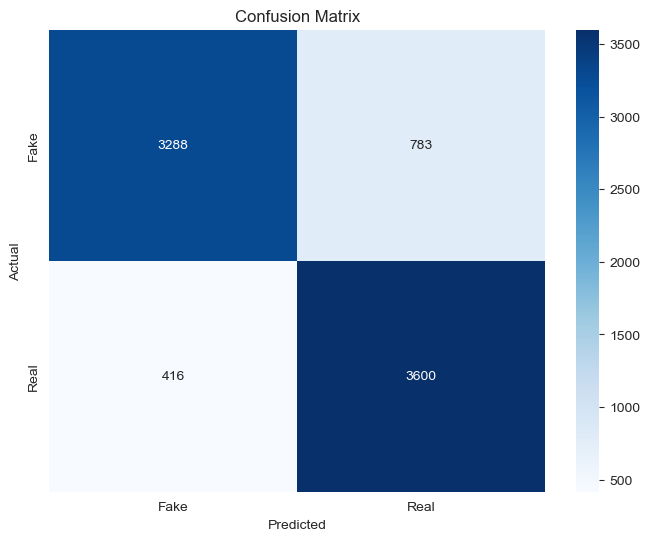

In [43]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score,accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get predictions
y_pred = model.predict(X_test)
y_pred_sigmoid = tf.keras.activations.sigmoid(y_pred)
# Convert probabilities to binary predictions
y_pred_binary = [1 if p > np.mean(y_pred_sigmoid) else 0 for p in y_pred_sigmoid]


# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Define labels
labels = ['Fake', 'Real']

precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
accuracy = accuracy_score(y_test, y_pred_binary)

# Print the evaluation scores
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy:.4f}')

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## ROC Curve for DNN Model

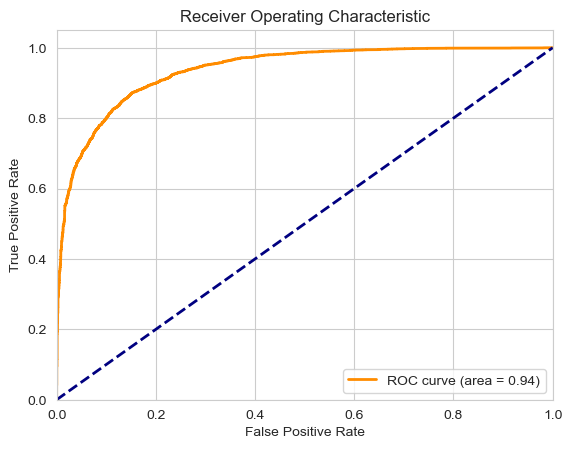

In [44]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_test, y_pred_sigmoid)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


## Save DNN Model

In [46]:
model.save_weights('./models/DNN/model_dnn.weights.h5')

# LSTM Model

## Vectorize Text into a variable length 

Instead of transforming text into a fixed-size vector with a fixed dimension, each text will be transform into a matrix with the columns of this matrix representing the vector for each word.

In [47]:
def vectorize_text_variable_length(text, model_w2v):
    word_vectors = [model_w2v.wv[word] for word in text if word in model_w2v.wv]
    
    if len(word_vectors) == 0:
        return np.zeros((1, model_w2v.vector_size))
    return np.array(word_vectors)

data['vectorized_text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(lambda x: vectorize_text_variable_length(x, model_w2v))
data.head()

,category,rating,label,text_,tokenized_text,text_length,tokenized_text_without_stopwords,text_without_stopwords,vectorized_text_without_stopwords
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18,"[love, thi, well, made, sturdi, veri, comfort,...",love thi well made sturdi veri comfort love ve...,"[[-0.88185215, -0.7953437, -1.5146174, 1.71104..."
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19,"[love, great, upgrad, origin, mine, coupl, year]",love great upgrad origin mine coupl year,"[[-0.88185215, -0.7953437, -1.5146174, 1.71104..."
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16,"[thi, pillow, save, back, love, look, feel, th...",thi pillow save back love look feel thi pillow,"[[0.17057033, -0.15348439, -0.62066513, 0.4426..."
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19,"[miss, inform, use, great, product, price]",miss inform use great product price,"[[-0.08777983, 0.6980672, -0.11778672, -0.3828..."
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20,"[veri, nice, set, good, qualiti, set, two, month]",veri nice set good qualiti set two month,"[[0.15703852, -1.5405293, -2.4744613, 0.458871..."


## Padding Sequences
To ensure that LSTM can process the input tensor during training, it's necessary to pad the input matrices so that they all have the same size. This is because TensorFlow requires each batch of data to be of a uniform shape. However, for inference, TensorFlow can handle inputs of variable sizes, allowing more flexibility.

*Note: For simplification in training the LSTM model, categorical variables and ratings have been excluded.*

In [48]:
from keras.preprocessing.sequence import pad_sequences

# Prepare data for the neural network
pd.set_option('future.no_silent_downcasting', True)
X = (data['vectorized_text_without_stopwords'].to_numpy())
max_sequence_length = max(len(x) for x in X)

# We need to pad the input because each matrix has variable columns size, so Tensorflow will accept the input tensor.
# This is for training only. For inferencing we can still use variable size
X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')

# CG (Fake) - 1
# OR (Real) - 0
y = data['label'].replace('CG', 1).replace('OR', 0).astype('int32').values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print('Training Data: ' + str(X_train))
print('Training Label: ' + str(y_train))

Training Data: [[[ 1.6836259e+00  8.0063507e-02 -5.1723343e-01 ... -4.5672658e-01
    1.6180053e+00  1.4300116e+00]
  [ 1.0725617e+00  1.5396798e-01 -2.5570130e-01 ...  1.7420784e-01
    9.2564267e-01  2.6856434e-01]
  [ 5.8931148e-01 -8.5396540e-01 -9.0839398e-01 ... -7.5769174e-01
    1.9953178e+00  1.5682352e-01]
  ...
  [ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  0.0000000e+00
    0.0000000e+00  0.0000000e+00]
  [ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  0.0000000e+00
    0.0000000e+00  0.0000000e+00]
  [ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  0.0000000e+00
    0.0000000e+00  0.0000000e+00]]

 [[-1.2846504e+00 -6.7439294e-01 -1.5344162e-01 ... -5.9408563e-01
    1.8943803e+00  5.9245437e-02]
  [-1.2689632e+00  5.0525403e-01 -2.5378567e-01 ... -3.2748893e-01
    5.7239777e-01  9.7856873e-01]
  [-5.2770364e-01 -1.5007783e-01  2.5176138e-01 ... -3.3514959e-01
   -1.0032620e-01  1.0301741e-01]
  ...
  [ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  0.0000000

## Training the LSTM Model

In [49]:
from keras.models import Model
from keras.layers import Input, LSTM, Dense

encoder_inputs = Input(shape=(None, 100))
encoder = LSTM(128)(encoder_inputs)
encoder_outputs = Dense(1, activation='sigmoid')(encoder) 
model_lstm = Model(inputs=encoder_inputs, outputs=encoder_outputs)  
# Compile the model
model_lstm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model_lstm.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])

# Evaluate the model
loss, accuracy = model_lstm.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')

Epoch 1/10


2024-04-11 11:25:22.131041: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


506/506 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step - accuracy: 0.4991 - loss: 0.6940 - val_accuracy: 0.4966 - val_loss: 0.6938
Epoch 2/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.4981 - loss: 0.6933 - val_accuracy: 0.4966 - val_loss: 0.6932
Epoch 3/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.4972 - loss: 0.6933 - val_accuracy: 0.4966 - val_loss: 0.6932
Epoch 4/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.4997 - loss: 0.6932 - val_accuracy: 0.4973 - val_loss: 0.6932
Epoch 5/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.5121 - loss: 0.6902 - val_accuracy: 0.4966 - val_loss: 0.6931
Epoch 6/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.4973 - loss: 0.6932 - val_accuracy: 0.4993 - val_loss: 0.6931
Epoch 7/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.5628 - loss: 0.6561 - val_accuracy: 0.7972 - val_loss: 0.4650
Epoch 8/10
506/506 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.8246 - loss: 0.4062 - val_accurac

## Evaluation scores for LSTM Model

In [50]:

# Get predictions
y_pred = model_lstm.predict(X_test)
y_pred_sigmoid = tf.keras.activations.sigmoid(y_pred)
# Convert probabilities to binary predictions
y_pred_binary = [1 if p > np.mean(y_pred_sigmoid) else 0 for p in y_pred_sigmoid]


# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Define labels
labels = ['Fake', 'Real']

precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
accuracy = accuracy_score(y_test, y_pred_binary)

# Print the evaluation scores
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy:.4f}')


# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

 12/253 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step

2024-04-11 11:28:43.807173: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


253/253 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


KeyboardInterrupt: 

## ROC Curve for LSTM Model

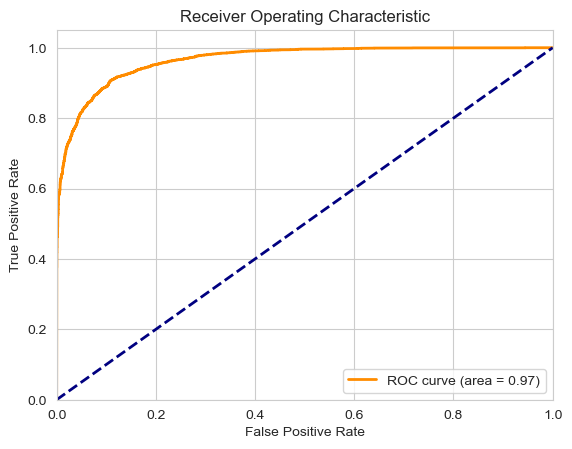

In [51]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_sigmoid)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


## Save LSTM Model

In [52]:
model_lstm.save_weights('./models/LSTM/model_lstm.weights.h5')

## Visualised Tensorboard

In [ ]:
%tensorboard --logdir logs